In [1]:
from vasttools.pipeline import Pipeline
from vasttools.query import Query
from bokeh.io import output_notebook
from bokeh.plotting import show
from astropy.coordinates import Angle, SkyCoord
from astropy import units as u
import matplotlib.pyplot as plt
import pandas as pd
import os
import numpy as np

%matplotlib inline
output_notebook()

Loading BokehJS ...

You can turn on detailed logging by uncommenting the below code

In [2]:
#from vasttools.utils import get_logger
#logger = get_logger(debug=True, quiet=False, logfile=None)

# Accessing Pipeline data products with vast-tools

## Getting set up

In [3]:
pipe = Pipeline()

In [4]:
pipe.list_piperuns()

['10s_FRB190110_FullField_DeepSubtraction',
 '10s_FRB190110_FullField_DeepSubtraction.bak',
 'BANE_no_forced_fits',
 'GalCtr_p2',
 'VAST_2118-06A',
 'combined',
 'crop-compress-comparison',
 'crop-compress-comparison-base',
 'dwf_O12',
 'dwf_sep2021_final',
 'full_survey_tiles',
 'full_survey_tiles_test',
 'galctr_p1_test',
 'gw190814_10_epochs',
 'mc_p1_test',
 'no-meas-pairs-test',
 'racs-low-tiles-bane',
 'racs-low-tiles-bane-test',
 'racs_comparison',
 'racs_comparison_no_force',
 'smc-low',
 'test_ui_1',
 'tiles-low-corrected',
 'tiles-mid-corrected',
 'tiles_corrected',
 'two_epoch_test',
 'workshop-2023-run',
 'ym_Test']

In [5]:
run_name = 'workshop-2023-run'
run = pipe.load_run(run_name)

/home/jovyan/vast-tools/vasttools/pipeline.py:2701: UserWarning: Measurements have been loaded with vaex.
  warnings.warn("Measurements have been loaded with vaex.")
Measurement pairs file (/data/vast-pipeline/vast-pipeline/pipeline-runs/workshop-2023-run/measurement_pairs.parquet) does not exist. You will be unable to access measurement pairs or two-epoch metrics.


In [6]:
run.images

,band_id,skyreg_id,measurements_path,polarisation,name,path,noise_path,background_path,datetime,jd,...,beam_bmin,beam_bpa,rms_median,rms_min,rms_max,centre_ra,centre_dec,xtr_radius,frequency,bandwidth
id,,,,,,,,,,,,,,,,,,,,,
23874,1,9390,/data/vast-pipeline/vast-pipeline/pipeline-run...,I,image.i.VAST_0127-73A.SB45555.cont.taylor.0.re...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,2022-11-14 12:49:14.700000+00:00,2.459898e+06,...,0.003639,-18.41,0.198549,0.132378,6.565116,21.812002,-73.071992,4.454763,887.0,0.0
23875,1,9391,/data/vast-pipeline/vast-pipeline/pipeline-run...,I,image.i.VAST_0530-68A.SB45563.cont.taylor.0.re...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,2022-11-14 16:44:38.400000+00:00,2.459898e+06,...,0.003472,-20.99,0.217453,0.154000,61.209753,82.501912,-68.697878,4.454768,887.0,0.0
23876,1,9392,/data/vast-pipeline/vast-pipeline/pipeline-run...,I,image.i.VAST_0709-12A.SB45567.cont.taylor.0.re...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,2022-11-14 18:48:43.500000+00:00,2.459898e+06,...,0.003417,8.72,0.215379,0.149857,2.229887,107.369132,-12.586381,4.454768,887.0,0.0
23877,1,9393,/data/vast-pipeline/vast-pipeline/pipeline-run...,I,image.i.VAST_0725-18A.SB45572.cont.taylor.0.re...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,2022-11-14 19:56:34.400000+00:00,2.459898e+06,...,0.003250,14.86,0.208304,0.144672,3.531292,111.272725,-18.863314,4.454764,887.0,0.0
23878,1,9394,/data/vast-pipeline/vast-pipeline/pipeline-run...,I,image.i.VAST_0734-12A.SB45568.cont.taylor.0.re...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,2022-11-14 19:01:49.800000+00:00,2.459898e+06,...,0.003500,6.98,0.204287,0.144626,0.801221,113.684208,-12.586381,4.454773,887.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25032,1,10242,/data/vast-pipeline/vast-pipeline/pipeline-run...,I,image.i.VAST_1753-18.SB51489.cont.taylor.0.res...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,2023-07-18 15:43:59.800000+00:00,2.460144e+06,...,0.003028,82.36,0.432030,0.211786,5.244236,268.364367,-18.864008,4.454778,887.0,0.0
25033,1,9354,/data/vast-pipeline/vast-pipeline/pipeline-run...,I,image.i.VAST_1806-12.SB51490.cont.taylor.0.res...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,2023-07-18 15:57:40.800000+00:00,2.460144e+06,...,0.003056,83.46,0.394638,0.192536,20.542279,271.579657,-12.586381,4.454773,887.0,0.0
25034,1,9320,/data/vast-pipeline/vast-pipeline/pipeline-run...,I,image.i.VAST_1806-25.SB51529.cont.taylor.0.res...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,2023-07-21 13:37:27.600000+00:00,2.460147e+06,...,0.003139,79.94,0.302299,0.187404,18.723287,271.698880,-25.131178,4.454773,887.0,0.0


In [7]:
run.measurements

#,source,island_id,component_id,local_rms,ra,ra_err,dec,dec_err,flux_peak,flux_peak_err,flux_int,flux_int_err,bmaj,err_bmaj,bmin,err_bmin,pa,err_pa,psf_bmaj,psf_bmin,psf_pa,flag_c4,chi_squared_fit,spectral_index,spectral_index_from_TT,has_siblings,image_id,time,name,snr,compactness,ew_sys_err,ns_sys_err,error_radius,uncertainty_ew,uncertainty_ns,weight_ew,weight_ns,forced,flux_int_isl_ratio,flux_peak_isl_ratio,id
0,34711110,SB45535_island_2,SB45535_component_2a,0.609000027179718,240.9612274169922,5.765886044173385e-07,-49.068092346191406,6.80719551837683e-07,1632.9739990234375,0.6177468299865723,1734.574951171875,1.1143282651901245,15.84000015258789,1.6511976355104707e-06,12.260000228881836,1.2986857882424374e-06,157.13999938964844,0.0010410879040136933,3.450000047683716,3.1700000762939453,26.540000915527344,True,5391.97802734375,-0.009999999776482582,True,False,23896,2022-11-14 03:18:35.400000,VAST_1600-50A_SB45535_component_2a,2681.402099609375,1.0622183084487915,0.00027777778450399637,0.00027777778450399637,0.0,0.00027777778450399637,0.00027777778450399637,12960000.0,12960000.0,False,1.0,1.0,236408494
1,35076138,SB45535_island_2,SB45535_component_2a,0.609000027179718,240.9612274169922,5.765886044173385e-07,-49.068092346191406,6.80719551837683e-07,1632.9739990234375,0.6177468299865723,1734.574951171875,1.1143282651901245,15.84000015258789,1.6511976355104707e-06,12.260000228881836,1.2986857882424374e-06,157.13999938964844,0.0010410879040136933,3.450000047683716,3.1700000762939453,26.540000915527344,True,5391.97802734375,-0.009999999776482582,True,False,23896,2022-11-14 03:18:35.400000,VAST_1600-50A_SB45535_component_2a,2681.402099609375,1.0622183084487915,0.00027777778450399637,0.00027777778450399637,0.0,0.00027777778450399637,0.00027777778450399637,12960000.0,12960000.0,False,1.0,1.0,236408494
2,34139985,SB45535_island_2,SB45535_component_2a,0.609000027179718,240.9612274169922,5.765886044173385e-07,-49.068092346191406,6.80719551837683e-07,1632.9739990234375,0.6177468299865723,1734.574951171875,1.1143282651901245,15.84000015258789,1.6511976355104707e-06,12.260000228881836,1.2986857882424374e-06,157.13999938964844,0.0010410879040136933,3.450000047683716,3.1700000762939453,26.540000915527344,True,5391.97802734375,-0.009999999776482582,True,False,23896,2022-11-14 03:18:35.400000,VAST_1600-50A_SB45535_component_2a,2681.402099609375,1.0622183084487915,0.00027777778450399637,0.00027777778450399637,0.0,0.00027777778450399637,0.00027777778450399637,12960000.0,12960000.0,False,1.0,1.0,236408494
3,35671355,SB45535_island_2,SB45535_component_2a,0.609000027179718,240.9612274169922,5.765886044173385e-07,-49.068092346191406,6.80719551837683e-07,1632.9739990234375,0.6177468299865723,1734.574951171875,1.1143282651901245,15.84000015258789,1.6511976355104707e-06,12.260000228881836,1.2986857882424374e-06,157.13999938964844,0.0010410879040136933,3.450000047683716,3.1700000762939453,26.540000915527344,True,5391.97802734375,-0.009999999776482582,True,False,23896,2022-11-14 03:18:35.400000,VAST_1600-50A_SB45535_component_2a,2681.402099609375,1.0622183084487915,0.00027777778450399637,0.00027777778450399637,0.0,0.00027777778450399637,0.00027777778450399637,12960000.0,12960000.0,False,1.0,1.0,236408494
4,34711110,SB45536_island_2,SB45536_component_2a,0.7149999737739563,240.96148681640625,6.511651235996396e-07,-49.06822204589844,8.000050684131566e-07,1630.824951171875,0.7258985042572021,1737.7879638671875,1.3119335174560547,15.460000038146973,1.8961658270200132e-06,12.180000305175781,1.518142767054087e-06,169.05999755859375,0.0013180375099182129,3.4800000190734863,3.200000047683716,42.72999954223633,True,5720.62890625,-0.009999999776482582,True,False,23897,2022-11-14 03:48:27,VAST_1600-50A_SB45536_component_2a,2280.8740234375,1.0655882358551025,0.00027777778450399637,0.00027777778450399637,1.2074182222931995e-06,0.0002777804038487375,0.0002777804038487375,12959755.0,12959755.0,False,1.0,1.0,236412363
...,...,...,...,...,...,...,...,...,...,...,...,...,

In [8]:
run.sources

,wavg_ra,wavg_dec,avg_compactness,min_snr,max_snr,wavg_uncertainty_ew,wavg_uncertainty_ns,avg_flux_int,avg_flux_peak,max_flux_peak,...,eta_int,eta_peak,new,new_high_sigma,n_neighbour_dist,n_measurements,n_selavy,n_forced,n_siblings,n_relations
id,,,,,,,,,,,,,,,,,,,,,
34126486,236.529813,-46.921929,1.042828,233.692533,1563.215444,0.000057,0.000057,859.392121,822.237792,891.859009,...,26243.781208,6.661569e+04,False,0.000000,0.000055,24,23,1,4,4
34126487,242.582854,-52.101387,3.010033,27.855187,60.204924,0.000059,0.000059,997.661493,327.078374,366.240997,...,102.674473,2.495691e+01,False,0.000000,0.000080,24,24,0,24,1
34126488,235.304907,-50.929669,1.071633,73.754721,147.232421,0.000057,0.000057,119.045992,115.834367,1760.365824,...,918209.359865,1.036577e+06,False,0.000000,0.000099,24,23,1,23,1
34126489,239.110485,-47.593691,1.358169,72.784453,483.101479,0.000057,0.000057,135.826667,98.529334,195.173004,...,6003.317001,8.161030e+03,False,0.000000,0.000118,24,24,0,22,8
34126490,236.748967,-51.036385,1.166523,168.687326,228.102281,0.000057,0.000057,70.605334,60.532000,63.761002,...,13.511259,1.762682e+01,False,0.000000,0.006064,24,24,0,24,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35880822,123.643006,-46.394341,1.008086,5.350962,5.350962,0.000060,0.000060,0.599473,0.599064,1.113000,...,0.954638,1.151762e+00,True,4.546294,0.043804,22,1,21,0,0
35880823,124.117371,-45.904983,0.866171,5.407035,5.407035,0.000060,0.000060,0.472639,0.479184,1.076000,...,0.928921,1.303998e+00,True,4.313165,0.018336,22,1,21,0,0
35880824,125.901017,-41.890530,1.165103,5.330000,5.330000,0.000060,0.000060,0.458302,0.450302,1.066000,...,1.761136,2.005094e+00,True,4.051201,0.036845,22,1,21,0,0


In [9]:
run.sources.columns

Index(['wavg_ra', 'wavg_dec', 'avg_compactness', 'min_snr', 'max_snr',
       'wavg_uncertainty_ew', 'wavg_uncertainty_ns', 'avg_flux_int',
       'avg_flux_peak', 'max_flux_peak', 'max_flux_int', 'min_flux_peak',
       'min_flux_int', 'min_flux_peak_isl_ratio', 'min_flux_int_isl_ratio',
       'v_int', 'v_peak', 'eta_int', 'eta_peak', 'new', 'new_high_sigma',
       'n_neighbour_dist', 'n_measurements', 'n_selavy', 'n_forced',
       'n_siblings', 'n_relations'],
      dtype='object')

In [10]:
run.sources[['avg_compactness', 'min_snr', 'max_snr','avg_flux_peak', 'max_flux_peak', 'min_flux_peak', 'v_peak', 'eta_peak', 'n_neighbour_dist', 'n_measurements', 'n_selavy', 'n_forced']]

,avg_compactness,min_snr,max_snr,avg_flux_peak,max_flux_peak,min_flux_peak,v_peak,eta_peak,n_neighbour_dist,n_measurements,n_selavy,n_forced
id,,,,,,,,,,,,
34126486,1.042828,233.692533,1563.215444,822.237792,891.859009,165.688004,0.202452,6.661569e+04,0.000055,24,23,1
34126487,3.010033,27.855187,60.204924,327.078374,366.240997,235.822006,0.116072,2.495691e+01,0.000080,24,24,0
34126488,1.071633,73.754721,147.232421,115.834367,1760.365824,36.606998,3.024320,1.036577e+06,0.000099,24,23,1
34126489,1.358169,72.784453,483.101479,98.529334,195.173004,41.195999,0.383845,8.161030e+03,0.000118,24,24,0
34126490,1.166523,168.687326,228.102281,60.532000,63.761002,57.185001,0.023005,1.762682e+01,0.006064,24,24,0
...,...,...,...,...,...,...,...,...,...,...,...,...
35880822,1.008086,5.350962,5.350962,0.599064,1.113000,0.133225,0.385538,1.151762e+00,0.043804,22,1,21
35880823,0.866171,5.407035,5.407035,0.479184,1.076000,0.215695,0.480764,1.303998e+00,0.018336,22,1,21
35880824,1.165103,5.330000,5.330000,0.450302,1.066000,0.022464,0.665655,2.005094e+00,0.036845,22,1,21


In [11]:
run.sources_skycoord

<SkyCoord (ICRS): (ra, dec) in deg
    [(236.52981282, -46.92192887), (242.5828542 , -52.10138671),
     (235.30490653, -50.92966946), ..., (125.901017  , -41.89053   ),
     (123.325994  , -41.770857  ), (122.804452  , -43.975169  )]>

## Searching for interesting sources

In [12]:
single_det_query_str = (
    "n_measurements >= 10" # Require at least 10 measurements
    "& n_selavy == 1" # Only interested in sources that are detected once
    "& n_neighbour_dist > 1./60. " # nearest neighbour should be at least 1 arcmin away
    "& 0.8 < avg_compactness < 1.4 " # Only interested in compact sources
    "& n_relations == 0" # Only interested in sources that are not islands
    "& max_snr >= 10.0"
)

In [13]:
run.sources.query(single_det_query_str).sort_values('max_snr', ascending=False)

,wavg_ra,wavg_dec,avg_compactness,min_snr,max_snr,wavg_uncertainty_ew,wavg_uncertainty_ns,avg_flux_int,avg_flux_peak,max_flux_peak,...,eta_int,eta_peak,new,new_high_sigma,n_neighbour_dist,n_measurements,n_selavy,n_forced,n_siblings,n_relations
id,,,,,,,,,,,,,,,,,,,,,
34260695,268.894893,-25.463949,1.029498,52.995782,52.995782,0.000062,0.000062,1.964267,1.927217,25.120001,...,48.210524,134.550331,True,53.775164,0.041562,20,1,19,0,0
34710644,263.516906,-34.753628,1.151416,30.627292,30.627292,0.000058,0.000058,0.866372,0.767372,15.038000,...,15.001008,38.776900,True,26.702201,0.065086,23,1,22,0,0
35670866,175.723304,-64.952444,0.990379,25.710528,25.710528,0.000058,0.000058,0.156443,0.158487,4.885000,...,10.631861,29.980321,True,17.335050,0.035966,23,1,22,0,0
35302624,122.955231,-44.899964,1.139066,15.562189,15.562189,0.000059,0.000059,0.369862,0.350089,3.128000,...,5.318421,10.863082,False,0.000000,0.030350,22,1,21,0,0
35880472,272.843122,-16.670335,0.969044,12.824121,12.824121,0.000061,0.000061,0.220008,0.227532,5.104000,...,4.066510,9.480812,True,12.415610,0.030456,21,1,20,0,0
34847432,262.542260,-25.718873,1.394580,12.399194,12.399194,0.000063,0.000063,0.645720,0.463720,9.225000,...,4.047888,8.269197,True,40.181501,0.020534,20,1,19,0,0
34945402,273.629631,-17.157413,1.164271,12.295762,12.295762,0.000061,0.000061,2.253270,2.146604,13.636000,...,4.009831,7.314234,True,11.529048,0.053817,21,1,20,0,0
35785232,145.804384,-48.956930,1.126368,12.256098,12.256098,0.000060,0.000060,0.235416,0.218098,3.015000,...,4.140727,8.150902,True,14.603400,0.064564,22,1,21,0,0
35199035,267.978600,-25.859781,1.179800,12.022556,12.022556,0.000063,0.000063,0.331224,0.273724,6.396000,...,3.407202,7.711632,True,13.347927,0.046077,20,1,19,0,0


### Eta-V analysis

You can search for variables using the standard Eta-V variability metrics (https://www.vast-survey.org/vast-pipeline/v1.0.0/design/sourcestats/#v-and-metrics)

V quantifies the amplitude of the variability, while eta quantifies its statistical significance

In [14]:
eta_v_query_str = (
    "n_measurements >= 10 " # require at least 10 measurements (selavy or forced)
    "& n_selavy > n_measurements / 2" # sources should be detected in at least half the observations
    "& n_neighbour_dist > 1./60. " # nearest neighbour should be at least 1 arcmin away
    "& 0.8 < avg_compactness < 1.4 "
    "& n_relations == 0"
    "& max_snr >= 10.0"
)

In [15]:
eta_thresh, v_thresh, eta_v_candidates, plot = run.run_eta_v_analysis(1.0, 1.0, query=eta_v_query_str)
print(eta_thresh, v_thresh)

/opt/conda/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
Negative V encountered. Removing...


1.9640060647800266 0.11584095939174516


In [16]:
eta_v_candidates

,wavg_ra,wavg_dec,avg_compactness,min_snr,max_snr,wavg_uncertainty_ew,wavg_uncertainty_ns,avg_flux_int,avg_flux_peak,max_flux_peak,...,eta_int,eta_peak,new,new_high_sigma,n_neighbour_dist,n_measurements,n_selavy,n_forced,n_siblings,n_relations
id,,,,,,,,,,,,,,,,,,,,,
34126559,236.249153,-53.146610,1.088225,15.361257,34.956960,0.000050,0.000050,11.373794,10.476471,13.892,...,10.320595,30.099554,False,0.000000,0.042767,34,34,0,1,0
34127634,271.528179,-11.908252,1.116716,13.025891,49.935134,0.000060,0.000060,5.680583,5.135292,9.619,...,19.331954,58.570683,False,0.000000,0.056589,24,24,0,0,0
34127676,271.669568,-14.352936,1.020561,11.722420,16.303030,0.000064,0.000064,3.808186,3.739478,4.486,...,2.033466,2.532567,False,0.000000,0.018536,24,23,1,0,0
34128682,12.868557,-74.472412,1.086783,8.183487,19.385366,0.000074,0.000074,3.068333,2.837619,3.974,...,3.550404,10.507314,False,0.000000,0.065130,21,21,0,0,0
34128683,15.533642,-70.545278,1.029913,7.947619,17.488480,0.000074,0.000074,2.858143,2.784714,3.795,...,2.076257,6.218561,False,0.000000,0.025407,21,21,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35773797,214.728643,-53.581018,1.077026,12.571429,22.772948,0.000065,0.000065,4.240909,3.971227,5.089,...,1.734390,7.873348,False,0.000000,0.061289,22,22,0,0,0
35774157,229.043898,-64.416025,1.093486,7.721992,15.260869,0.000070,0.000070,3.291045,3.028227,3.844,...,1.120984,3.705864,False,0.000000,0.030781,22,22,0,0,0
35774521,226.583861,-56.328182,1.030963,5.125490,10.550239,0.000081,0.000081,1.371971,1.330653,2.205,...,2.342619,3.239254,False,0.000000,0.028338,22,19,3,0,0


In [17]:
show(plot)

In [18]:
v_peak_cut = 0.35
eta_peak_cut = 50
strong_cands = eta_v_candidates.query(f"v_peak > {v_peak_cut} | eta_peak > {eta_peak_cut}").sort_values("v_peak", ascending=False)
strong_cands

,wavg_ra,wavg_dec,avg_compactness,min_snr,max_snr,wavg_uncertainty_ew,wavg_uncertainty_ns,avg_flux_int,avg_flux_peak,max_flux_peak,...,eta_int,eta_peak,new,new_high_sigma,n_neighbour_dist,n_measurements,n_selavy,n_forced,n_siblings,n_relations
id,,,,,,,,,,,,,,,,,,,,,
35765499,264.281904,-26.304581,1.138745,17.659630,35.193832,0.000064,0.000064,1.539665,0.584515,7.989000,...,0.889876,2.606540,False,0.0,0.057579,20,19,1,0,0
35765512,264.498966,-26.263660,1.345301,5.414082,22.030534,0.000070,0.000070,25.998749,22.203449,332.088989,...,1.710658,2.233469,False,0.0,0.022098,20,20,0,0,0
34947439,264.532857,-25.992005,1.141683,12.307693,24.415930,0.000066,0.000066,9.966784,9.298784,86.688689,...,0.866511,2.088557,False,0.0,0.043676,20,19,1,0,0
34478910,263.304865,-25.672938,1.106522,6.694340,13.775785,0.000075,0.000075,4.516514,4.253964,36.702276,...,1.485054,2.188735,False,0.0,0.049682,20,19,1,0,0
34478919,264.866500,-24.544009,1.076950,6.684932,11.691667,0.000079,0.000079,1.745685,1.617485,2.806000,...,0.892504,2.057640,False,0.0,0.032623,20,19,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34247011,120.326658,-26.178527,1.055587,132.152775,204.825148,0.000059,0.000059,32.715364,31.021318,38.389000,...,131.559048,416.381766,False,0.0,0.118232,22,22,0,0,0
34833222,121.478222,-30.825825,1.060918,66.866910,109.116508,0.000059,0.000059,21.064455,19.858409,23.691000,...,39.284619,113.929207,False,0.0,0.022577,22,22,0,0,0
34718948,154.637191,-54.568478,1.049732,66.786258,133.612363,0.000059,0.000059,20.481045,19.501046,23.783001,...,54.016971,143.697542,False,0.0,0.049262,22,22,0,0,0


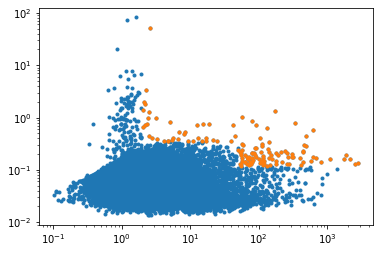

In [19]:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.scatter(run.sources.query(eta_v_query_str).eta_peak, run.sources.query(eta_v_query_str).v_peak, marker='.')
ax.scatter(strong_cands.eta_peak, strong_cands.v_peak, marker='.')
#ax.axhline(v_peak_cut)
#ax.axvline(eta_peak_cut)
ax.set_xscale('log')
ax.set_yscale('log')

In [20]:
cols_to_include = ['wavg_ra', 'wavg_dec', 'avg_flux_peak', 'max_flux_peak', 'min_flux_peak', 'v_peak', 'eta_peak', 'n_neighbour_dist', 'n_measurements', 'n_selavy', 'n_forced']

strong_cands[cols_to_include].to_csv('workshop-2023-cands.csv')

## Inspecting individual sources

In [21]:
idx = 35430820
source = run.get_source(idx)

print(f"https://dev.pipeline.vast-survey.org/sources/{idx}/")

https://dev.pipeline.vast-survey.org/sources/35430820/


In [22]:
source.measurements

,source,island_id,component_id,local_rms,ra,ra_err,dec,dec_err,flux_peak,flux_peak_err,...,id,image,rms,selavy,frequency,field,epoch,stokes,skycoord,detection
0,35430820,SB45582_island_12003,SB45582_component_12003a,0.218199,150.968430,0.000003,-56.189739,0.000003,0.680588,0.218199,...,249554589,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-pipeline/vast-pipeline/pipeline-run...,887.0,workshop-2023-run,1,I,"<SkyCoord (ICRS): (ra, dec) in deg\n (150.9...",False
1,35430820,SB45739_island_12061,SB45739_component_12061a,0.206896,150.968430,0.000003,-56.189739,0.000003,0.543042,0.206896,...,249559599,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-pipeline/vast-pipeline/pipeline-run...,887.0,workshop-2023-run,2,I,"<SkyCoord (ICRS): (ra, dec) in deg\n (150.9...",False
2,35430820,SB45966_island_11943,SB45966_component_11943a,0.247127,150.968430,0.000003,-56.189739,0.000003,1.112971,0.247127,...,249564915,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-pipeline/vast-pipeline/pipeline-run...,887.0,workshop-2023-run,3,I,"<SkyCoord (ICRS): (ra, dec) in deg\n (150.9...",False
3,35430820,SB46789_island_12083,SB46789_component_12083a,0.194995,150.968430,0.000003,-56.189739,0.000003,0.694802,0.194995,...,249570044,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-pipeline/vast-pipeline/pipeline-run...,887.0,workshop-2023-run,4,I,"<SkyCoord (ICRS): (ra, dec) in deg\n (150.9...",False
4,35430820,SB47045_island_3813,SB47045_component_3813a,0.255000,150.968689,0.000218,-56.189663,0.000353,1.917000,0.271076,...,237028393,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-pipeline/vast-pipeline/pipeline-run...,887.0,workshop-2023-run,5,I,"<SkyCoord (ICRS): (ra, dec) in deg\n (150.9...",True
5,35430820,SB47221_island_4366,SB47221_component_4366a,0.227000,150.968231,0.000226,-56.189705,0.000254,1.489000,0.228351,...,237032783,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-pipeline/vast-pipeline/pipeline-run...,887.0,workshop-2023-run,6,I,"<SkyCoord (ICRS): (ra, dec) in deg\n (150.9...",True
6,35430820,SB47597_island_4138,SB47597_component_4138a,0.200000,150.968124,0.000260,-56.189503,0.000233,1.612000,0.212649,...,237036533,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-pipeline/vast-pipeline/pipeline-run...,887.0,workshop-2023-run,7,I,"<SkyCoord (ICRS): (ra, dec) in deg\n (150.9...",True
7,35430820,SB47665_island_4343,SB47665_component_4343a,0.229000,150.968292,0.000218,-56.190086,0.000252,1.483000,0.228905,...,237041016,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-pipeline/vast-pipeline/pipeline-run...,887.0,workshop-2023-run,8,I,"<SkyCoord (ICRS): (ra, dec) in deg\n (150.9...",True
8,35430820,SB48230_island_3609,SB48230_component_3609a,0.237000,150.967987,0.000226,-56.189716,0.000270,1.921000,0.248657,...,237774731,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-pipeline/vast-pipeline/pipeline-run...,887.0,workshop-2023-run,9,I,"<SkyCoord (ICRS): (ra, dec) in deg\n (150.9...",True
9,35430820,SB48512_island_4589,SB48512_component_4589a,0.241000,150.968475,0.000272,-56.190598,0.000271,1.363000,0.241041,...,237945258,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-survey/VAST/vast-data/TILES/STOKESI...,/data/vast-pipeline/vast-pipeline/pipeline-run...,887.0,workshop-2023-run,10,I,"<SkyCoord (ICRS): (ra, dec) in deg\n (150.9...",True


In [23]:
source.measurements.columns

Index(['source', 'island_id', 'component_id', 'local_rms', 'ra', 'ra_err',
       'dec', 'dec_err', 'flux_peak', 'flux_peak_err', 'flux_int',
       'flux_int_err', 'bmaj', 'err_bmaj', 'bmin', 'err_bmin', 'pa', 'err_pa',
       'psf_bmaj', 'psf_bmin', 'psf_pa', 'flag_c4', 'chi_squared_fit',
       'spectral_index', 'spectral_index_from_TT', 'has_siblings', 'image_id',
       'dateobs', 'name', 'snr', 'compactness', 'ew_sys_err', 'ns_sys_err',
       'error_radius', 'uncertainty_ew', 'uncertainty_ns', 'weight_ew',
       'weight_ns', 'forced', 'flux_int_isl_ratio', 'flux_peak_isl_ratio',
       'id', 'image', 'rms', 'selavy', 'frequency', 'field', 'epoch', 'stokes',
       'skycoord', 'detection'],
      dtype='object')

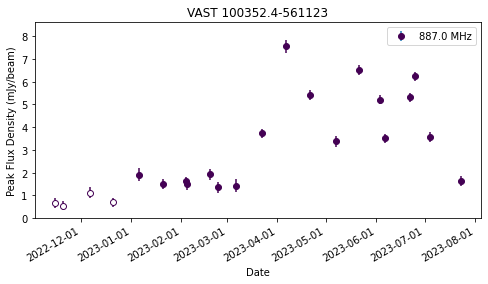

In [24]:
lc = source.plot_lightcurve()

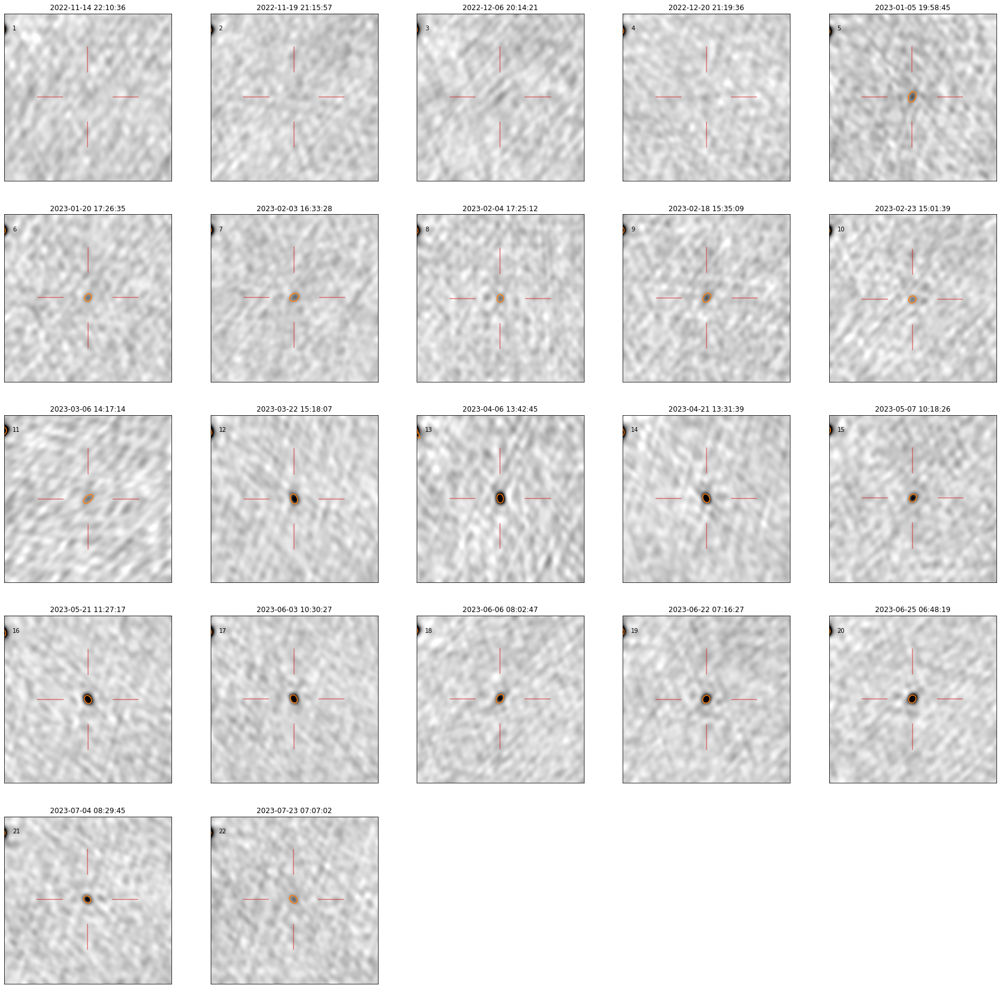

In [25]:
cutouts = source.show_all_png_cutouts(columns=5, figsize=(30,30))

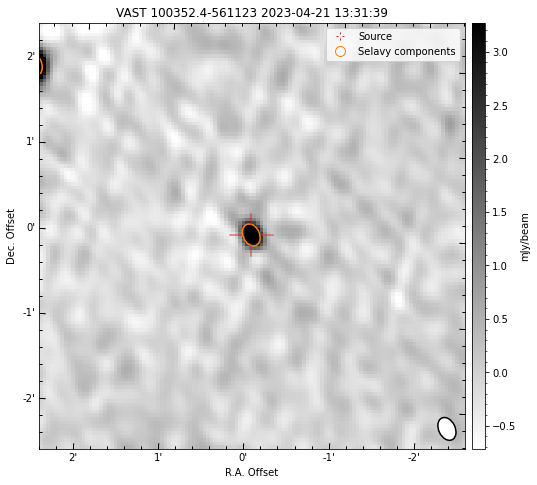

In [26]:
cutouts = source.show_png_cutout(13)

In [27]:
source.simbad_search()

MAIN_ID,RA,DEC,RA_PREC,DEC_PREC,COO_ERR_MAJA,COO_ERR_MINA,COO_ERR_ANGLE,COO_QUAL,COO_WAVELENGTH,COO_BIBCODE,RA_d,DEC_d,SCRIPT_NUMBER_ID
,"""h:m:s""","""d:m:s""",,,mas,mas,deg,,,,deg,deg,
object,str13,str13,int16,int16,float32,float32,int16,str1,str1,object,float64,float64,int32
HD 87525,10 03 52.5630,-56 11 22.883,14,14,0.023,0.022,90,A,O,2020yCat.1350....0G,150.96901286,-56.18968993,1


In [28]:
source.ned_search()

No.,Object Name,RA,DEC,Type,Velocity,Redshift,Redshift Flag,Magnitude and Filter,Separation,References,Notes,Photometry Points,Positions,Redshift Points,Diameter Points,Associations
,,degrees,degrees,,km / s,,,,arcmin,,,,,,,
int32,str30,float64,float64,object,float64,float64,object,object,float64,int32,int32,int32,int32,int32,int32,int32
1,HD 087525,150.96708,-56.19278,*,--,--,,8.1 V,0.188,4,0,0,1,0,0,0
2,WISEA J100352.52-561122.6,150.96871,-56.18964,IrS,--,--,,,0.011,0,0,17,3,0,0,0
3,2MASS J10035444-5611320,150.97687,-56.19223,IrS,--,--,,,0.318,0,0,6,1,0,0,0


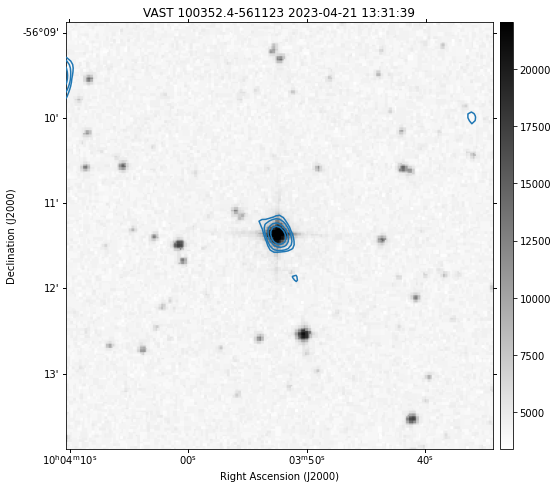

In [29]:
contour_plot = source.skyview_contour_plot(13, 'DSS')

### Things you can do with a Source:
* Plot lightcurves
* Plot cutouts and save to PNG
* Save FITS cutouts
* Save region files
* Search Simbad and NED
* Create contour plots with Skyview

# Accessing general data products with vast-tools

## Searching for Stokes V emission

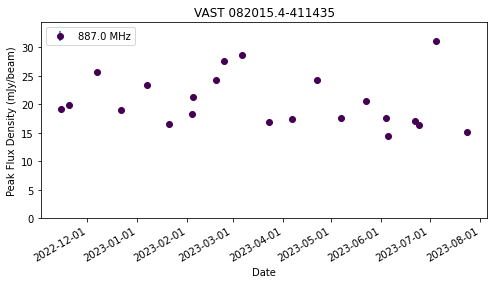

In [30]:
idx = 34951897
stokes_i_source = run.get_source(idx)
stokes_i_lc = stokes_i_source.plot_lightcurve()

In [31]:
query = Query(
    coords=stokes_i_source.coord,
    source_names=[stokes_i_source.name], # doesn't have to be provided
    matches_only=False, # return all sources regardless of if they are detected
    epochs="all-vast", # Automatically query all observed VAST epochs, although not all are available on nimbus or in the form we require
    crossmatch_radius=10., # Search for matches within a 10" radius
    output_dir='example-output',
    forced_fits=False, # Do not run forced fitting - I recommend turning this off for initial explorations because it is slow due to poor I/O on nimbus
    use_tiles=True, # We only have TILES data for the full survey
    corrected_data=False, # Do not use corrected data - this is not yet available for the full survey
    stokes='V' # Search Stokes V
)

query.find_sources()

Stokes V tiles are only available for the full VAST survey. Proceed with caution!
Stokes V images unavailable for epoch 1
Stokes V catalogues unavailable for epoch 1
Stokes V RMS maps unavailable for epoch 1
Stokes V images unavailable for epoch 2
Stokes V catalogues unavailable for epoch 2
Stokes V RMS maps unavailable for epoch 2
Stokes V images unavailable for epoch 3x
Stokes V catalogues unavailable for epoch 3x
Stokes V RMS maps unavailable for epoch 3x
Stokes V images unavailable for epoch 4x
Stokes V catalogues unavailable for epoch 4x
Stokes V RMS maps unavailable for epoch 4x
Stokes V images unavailable for epoch 5x
Stokes V catalogues unavailable for epoch 5x
Stokes V RMS maps unavailable for epoch 5x
Stokes V images unavailable for epoch 6x
Stokes V catalogues unavailable for epoch 6x
Stokes V RMS maps unavailable for epoch 6x
Stokes V images unavailable for epoch 7x
Stokes V catalogues unavailable for epoch 7x
Stokes V RMS maps unavailable for epoch 7x
Stokes V images unava

In [32]:
query.results

name
VAST 082015.4-411435    <vasttools.source.Source object at 0x7f81318fa...
Name: name, dtype: object

In [33]:
stokes_v_source = query.results.iloc[0]

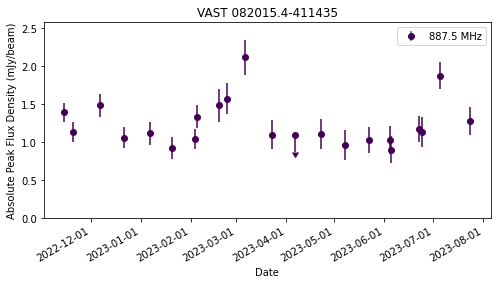

In [34]:
stokes_v_lc = stokes_v_source.plot_lightcurve()

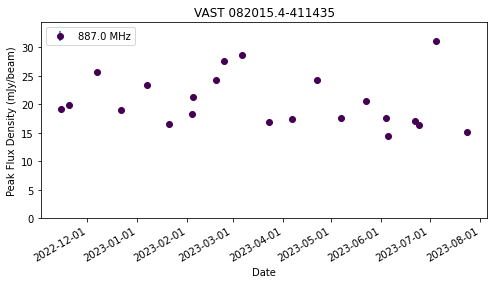

In [35]:
stokes_i_lc

In [36]:
stokes_i_source.measurements['sbid'] = stokes_i_source.measurements.island_id.str.split('_').str[0].str[2:].astype(int)
full_stokes_measurements = stokes_i_source.measurements.merge(stokes_v_source.measurements, how='left', left_on='sbid', right_on='sbid', suffixes=("_I", "_V"))

full_stokes_measurements['polarisation_frac'] = np.abs(full_stokes_measurements.flux_peak_V/full_stokes_measurements.flux_peak_I)
full_stokes_measurements['polarisation_frac_err'] = full_stokes_measurements.polarisation_frac*np.sqrt((full_stokes_measurements.flux_peak_err_V/full_stokes_measurements.flux_peak_V)**2+(full_stokes_measurements.flux_peak_err_I/full_stokes_measurements.flux_peak_I)**2)

/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
/opt/conda/lib/python3.8/site-packages/numpy/core/_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)


(0.0, 0.10049134762957693)

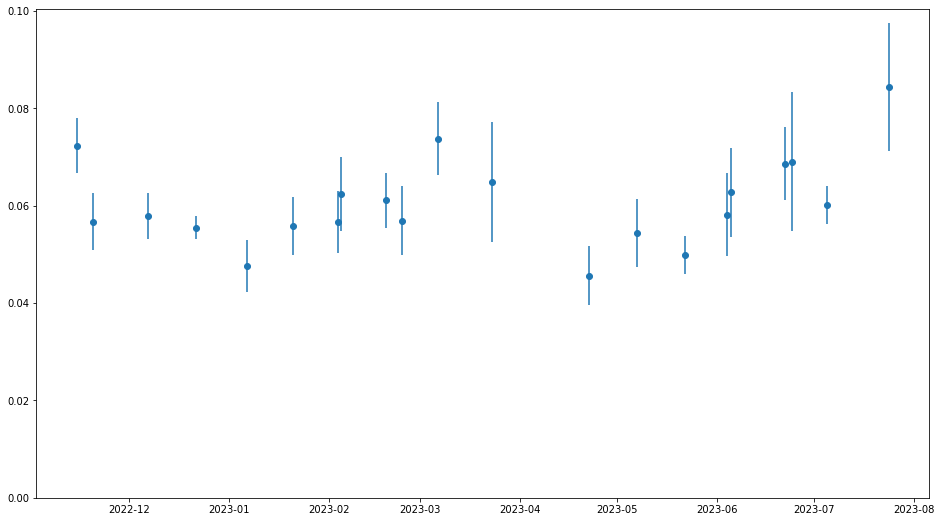

In [37]:
fig = plt.figure(figsize=(16,9))
ax = fig.add_subplot(111)
ax.errorbar(full_stokes_measurements.dateobs_I,
            full_stokes_measurements.polarisation_frac,
            yerr=full_stokes_measurements.polarisation_frac_err,
            marker='o',
            ls='')
ax.set_ylim(bottom=0)

# Catalogue crossmatching

In [38]:
from vasttools.moc import VASTMOCS
mocs = VASTMOCS()

In [39]:
psrcat_vast_sources = mocs.query_vizier_vast_pilot('B/psr', max_rows=200000) # Get all PSRCat sources that are within the VAST footprint

psrcat_vast_sources

_RAJ2000,_DEJ2000,PSRJ,r_PSRJ,RAJ2000,DEJ2000,Plx,e_Plx,r_Plx,P0,e_P0,r_P0,DM,e_DM,r_DM,S400,e_S400,r_S400,Dist,DistDM,r_DistDM,Age,Edot
deg,deg,,,,,mas,mas,,s,s,,pc.cm**-3,pc.cm**-3,,mJy,mJy,,kpc,kpc,,yr,1e-07W
float64,float64,object,str7,str11,str11,float32,float32,str7,float64,float32,str7,float64,float32,str7,float32,float64,str6,float32,float32,str4,float64,float64
8.5909506,-5.5768389,J0034-0534,bhl+94,00 34 21.83,-05 34 36.6,--,--,,0.00187718188458,2e-16,aaa+10b,13.765170,4e-05,aaa+10b,17.00,5.0000,tbms98,0.98,0.98,tc93,5990000000.0,3e+34
8.5369597,-7.3648358,J0034-0721,lvw69a,00 34 08.87,-07 21 53.4,0.930,0.080,cbv+09,0.94295099455980,2e-12,hlk+04,10.922000,0.006,srb+15,52.00,12.0000,lylg95,1.03,0.63,tc93,36600000.0,2e+31
11.3570417,-70.7019722,J0045-7042,mfl+06,00 45 25.69,-70 42 07.1,--,--,,0.63233580002000,6e-11,mfl+06,70.000000,3.0,mfl+06,--,--,,59.70,2.43,tc93,4020000.0,4e+32
11.3965000,-73.3175000,J0045-7319,mmh+91,00 45 35.16,-73 19 03.0,--,--,,0.92627590497000,3e-11,kbm+96,105.400000,0.7,kjb+94,1.00,--,mmh+91,59.70,2.55,tc93,3290000.0,2e+32
14.4333333,-72.0219444,J0057-7201,ckm+01,00 57 44.00,-72 01 19.0,--,--,,0.73806244260000,2e-10,ckm+01,27.000000,5.0,ckm+01,--,--,,2.49,2.49,tc93,117000000.0,1e+31
15.1792917,-72.1926667,J0100-7211,lfmp02,01 00 43.03,-72 11 33.6,--,--,,8.02039200000000,9e-06,mgr+05,--,--,,--,--,,59.70,--,,6760.0,1e+33
17.8698750,-71.5296667,J0111-7131,mfl+06,01 11 28.77,-71 31 46.8,--,--,,0.68854151164000,5e-11,mfl+06,76.000000,3.0,mfl+06,--,--,,59.70,2.46,tc93,1540000.0,9e+32
18.2962083,-72.3422778,J0113-7220,ckm+01,01 13 11.09,-72 20 32.2,--,--,,0.32588301613000,1e-11,ckm+01,125.490000,0.03,ckm+01,--,--,,59.70,2.51,tc93,1060000.0,6e+33


In [40]:
psrcat_pd = psrcat_vast_sources.to_pandas()

In [41]:
psr_scs = SkyCoord(psrcat_pd._RAJ2000, psrcat_pd._DEJ2000, unit=u.deg)

psr_names = list(psrcat_pd.PSRJ)

### Crossmatch to the pipeline
This will only provide you with information on sources that are detected at least once in the pipeline run. You should do this if you only care about detections

In [42]:
idx, d2d, _ = psr_scs.match_to_catalog_sky(run.sources_skycoord)
radius_limit = 15 * u.arcsec
d2d_mask = d2d <= radius_limit

In [43]:
# How many pulsars are detected?
d2d_mask.sum() 

155

In [44]:
# Select the crossmatches less than 15 arcsec
psrcat_crossmatch_result = psrcat_pd.loc[d2d_mask].copy()

# Append the id and distance of the VAST crossmatch to the PSRCAT sources
psrcat_crossmatch_result['vast_xmatch_id'] = run.sources.iloc[idx[d2d_mask]].index.values
psrcat_crossmatch_result['vast_xmatch_d2d_asec'] = d2d[d2d_mask].arcsec

# Join the result
psrcat_crossmatch_result = psrcat_crossmatch_result.merge(run.sources, how='left', left_on='vast_xmatch_id', right_index=True, suffixes=("_psrcat", "_vast"))
psrcat_crossmatch_result

,_RAJ2000,_DEJ2000,PSRJ,r_PSRJ,RAJ2000,DEJ2000,Plx,e_Plx,r_Plx,P0,...,eta_int,eta_peak,new,new_high_sigma,n_neighbour_dist,n_measurements,n_selavy,n_forced,n_siblings,n_relations
0,8.590951,-5.576839,J0034-0534,bhl+94,00 34 21.83,-05 34 36.6,NaN,NaN,,0.001877,...,10.305090,14.145589,False,0.000000,0.080727,2,1,1,0,0
1,8.536960,-7.364836,J0034-0721,lvw69a,00 34 08.87,-07 21 53.4,0.930,0.080,cbv+09,0.942951,...,809.955380,2620.817874,False,0.000000,0.046545,2,2,0,0,0
7,18.296208,-72.342278,J0113-7220,ckm+01,01 13 11.09,-72 20 32.2,NaN,NaN,,0.325883,...,3.615753,4.886742,True,5.127810,0.080766,21,7,14,0,0
9,23.385250,-69.958244,J0133-6957,lml+98,01 33 32.46,-69 57 29.7,NaN,NaN,,0.463474,...,8.420204,13.769838,True,5.441603,0.011036,21,7,14,0,0
10,27.844587,-6.584111,J0151-0635,mlt+78,01 51 22.70,-06 35 02.8,NaN,NaN,,1.464665,...,0.000000,0.000000,False,0.000000,0.032858,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339,335.524871,-1.621034,J2222-0137,blr+13,22 22 05.97,-01 37 15.7,3.742,0.016,dbl+13,0.032818,...,878.505527,1943.767409,False,0.000000,0.028904,2,2,0,0,0
340,339.216046,-55.463565,J2236-5527,bbb+13,22 36 51.85,-55 27 48.8,NaN,NaN,,0.006908,...,3.699505,7.128673,True,7.651812,0.039470,2,1,1,0,0
341,340.425077,-52.610063,J2241-5236,kjr+11,22 41 42.02,-52 36 36.2,NaN,NaN,,0.002187,...,22.747746,36.574156,False,0.000000,0.005697,2,1,1,1,0
342,342.112100,-1.030028,J2248-0101,mld+96,22 48 26.90,-01 01 48.1,NaN,NaN,,0.477233,...,0.000000,0.000000,False,0.000000,0.047162,1,1,0,0,0


### Use a Query

This will provide you with information on all sources regardless of whether they're detected. You should do this if a non-detection is still useful to you.

In [ ]:
"""
psrcat_query = Query(
    coords=psr_scs,
    source_names=psr_names, 
    matches_only=False,
    epochs="all-vast",
    crossmatch_radius=10., # Search for matches within a 10" radius
    output_dir='example-output',
    forced_fits=False, # Do not run forced fitting - I recommend turning this off for initial explorations because it is slow due to poor I/O on nimbus
    use_tiles=True, # 
    corrected_data=False, # Do not use corrected data - this is not yet available for the full survey
)

psrcat_query.find_sources()
"""